#***CAPTCHA SOLVER WITH YOLO ALGORITHM***


References:


1.   https://medium.com/@ahmetxgenc/yolo-darknet-ile-object-detection-19f21d8eb31b
2.   https://www.youtube.com/watch?v=ag3DLKsl2vk
3.   https://www.youtube.com/watch?v=bSAjikqlM2M



**Install dependecies**



In [1]:
# clone repo
!git clone https://github.com/ultralytics/yolov5  
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 10562, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 10562 (delta 2), reused 5 (delta 1), pack-reused 10554
Receiving objects: 100% (10562/10562), 10.71 MiB | 25.86 MiB/s, done.
Resolving deltas: 100% (7302/7302), done.
/content/yolov5


In [2]:
!pip install -qr requirements.txt  # install dependencies 
import torch
from IPython.display import Image, clear_output  # to display images
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 5.1 MB/s 
Setup complete. Using torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [3]:
!pip install -q roboflow
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="roboflow-yolov5")

     |████████████████████████████████| 145 kB 5.2 MB/s 
     |████████████████████████████████| 178 kB 42.4 MB/s 
     |████████████████████████████████| 1.1 MB 45.0 MB/s 
     |████████████████████████████████| 67 kB 6.2 MB/s 
     |████████████████████████████████| 138 kB 54.8 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.
upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=roboflow-yolov5


In [4]:
%cd /content/yolov5
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="61Jk5RA9Lf0nY2lx2Uuz") #This key is unique for our dataset
project = rf.workspace().project("yolo_v2")
dataset = project.version(2).download("yolov5")

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to yolo_v2-2 in yolov5pytorch:: 100%|██████████| 2826/2826 [00:02<00:00, 1222.07it/s]


**Check our labels**

In [5]:
%cat {dataset.location}/data.yaml

names:
- eight
- five
- four
- nine
- one
- seven
- six
- three
- two
- zero
nc: 10
train: yolo_v2-2/train/images
val: yolo_v2-2/valid/images


In [6]:
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [7]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 5.3 MB/s 
     |████████████████████████████████| 97 kB 6.1 MB/s 
     |████████████████████████████████| 142 kB 56.0 MB/s 
     |████████████████████████████████| 180 kB 54.5 MB/s 
     |████████████████████████████████| 63 kB 1.9 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=1a74a791f220ac0ba934a32d72d4d613bbdf2189e0fc2d93c1b5ffcded387121
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=9a209e13d4a4c044c8d09f6555d2e789639b602d8b520d0a6ce2c72e556427b9
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [9]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Training**

In [10]:
%%time
%cd /content/yolov5/  
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=, cfg=./models/yolov5s.yaml, data=/content/yolov5/yolo_v2-2/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, 

In [11]:
# Start tensorboard to save the training log under "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

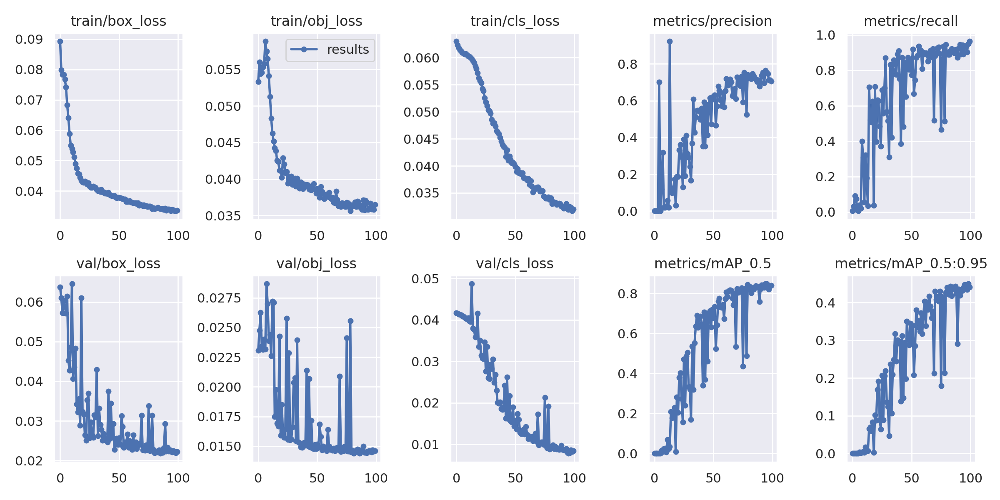

In [12]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


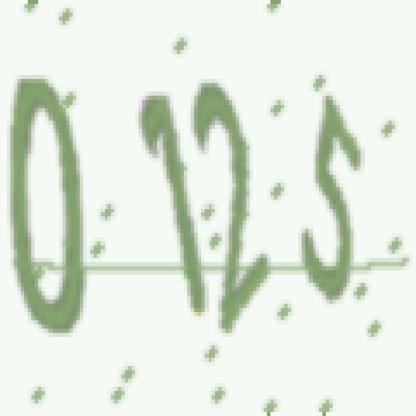

In [13]:
#Visualize our training data with labels
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/yolo_v2-2/test/images/0125_21c81df9-0740-4ad5-b698-c6355b29c507_png.rf.be7c9f1b402dbad3cfbab1717adafc4c.jpg', width=900)

In [14]:
%ls runs/

train/


In [15]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [16]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/yolo_v2-2/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/yolo_v2-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7037095 parameters, 0 gradients, 15.9 GFLOPs
image 1/59 /content/yolov5/yolo_v2-2/test/images/0125_21c81df9-0740-4ad5-b698-c6355b29c507_png.rf.be7c9f1b402dbad3cfbab1717adafc4c.jpg: 416x416 1 five, 1 one, 1 zero, Done. (0.028s)
image 2/59 /content/yolov5/yolo_v2-2/test/images/0163_da6996c5-1aec-4a24-95d1-d20989fe2ca6_png.rf.aa006f97a17ae948ba71c2cfd6a0515f.jpg: 416x416 1 

**Testing**

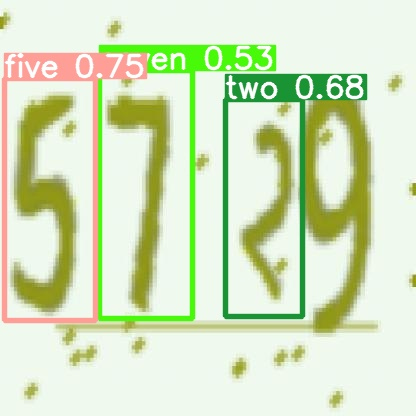

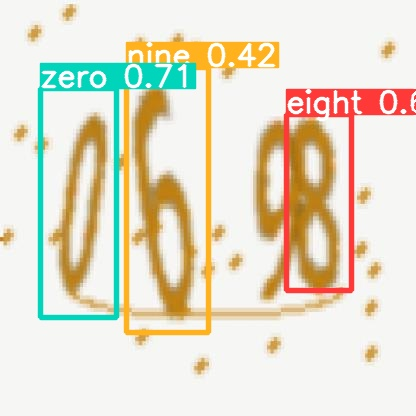

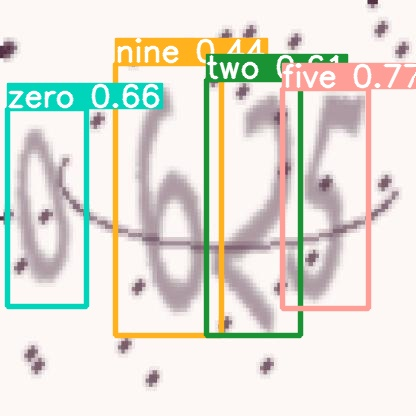

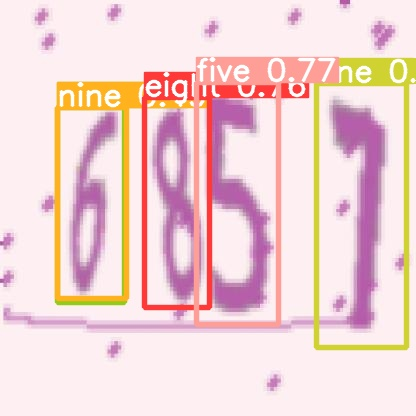

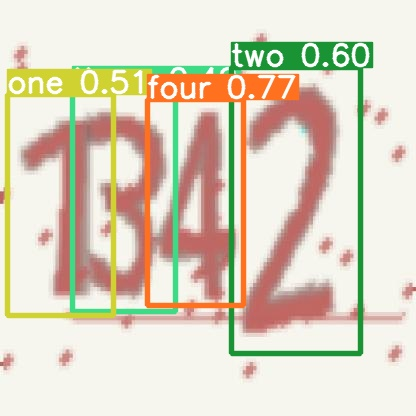

...

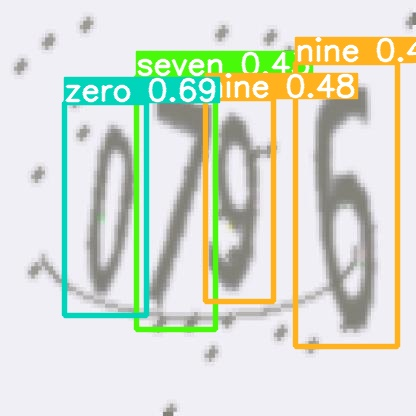

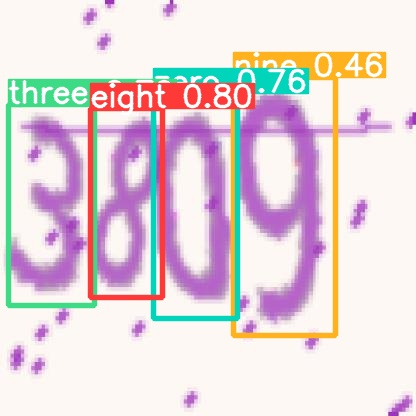

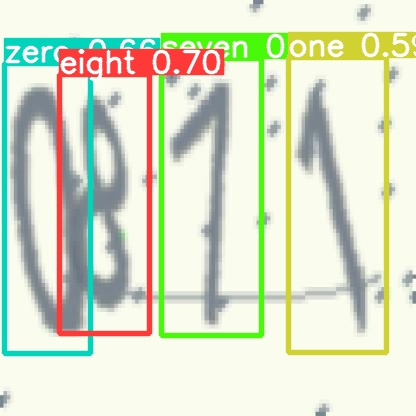

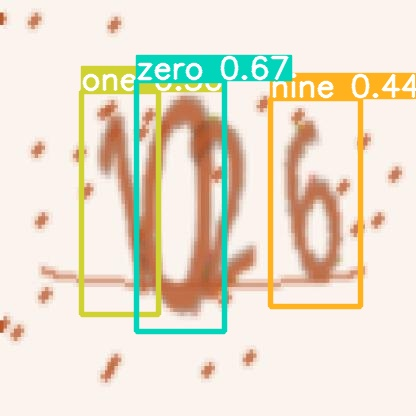

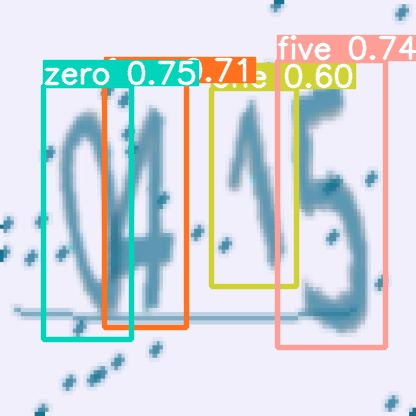

In [17]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [25]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/Concatenated_Captchas

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/drive/MyDrive/Concatenated_Captchas, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-193-gdb1f83b torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 7037095 parameters, 0 gradients, 15.9 GFLOPs
image 1/10 /content/drive/MyDrive/Concatenated_Captchas/0151.png: 192x416 1 five, 1 seven, Done. (0.022s)
image 2/10 /content/drive/MyDrive/Concatenated_Captchas/0266.png: 192x416 1 zero, Done. (0.022s)
image 3/10 /content/drive/MyDrive/Concatenated_Captchas/0382.png: 192x416 1 eight, 1 two, Done. (0.022s)
image 4/10 /c

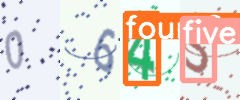

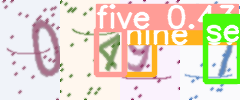

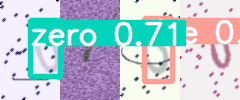

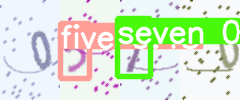

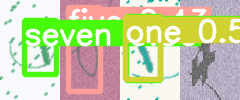

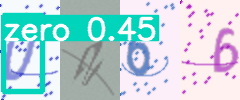

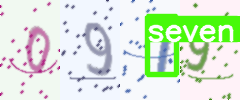

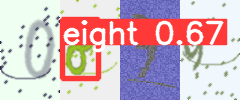

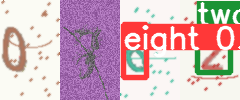

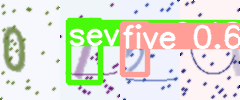

In [27]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.png'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [28]:
!cp -r /content/yolov5 /content/drive/MyDrive/Last_version_of_YOLOTEST